# DermNet Skin Condition Diagnosis
# ConvNeXt-Base — Training, Evaluation & Grad-CAM Auditing

**Platform:** Kaggle (P100 GPU)  
**Framework:** PyTorch + timm

| Section | Content |
|---|---|
| 1 | Environment, installs, GPU check |
| 2 | Configuration block |
| 3 | Architectural discussion — why ConvNeXt-Base, how it differs from EfficientNetV2-S |
| 4 | Class discovery & label encoding |
| 5 | Image manifests & stratified K-fold splits |
| 6 | Class weights for Focal Loss |
| 7 | Augmentation pipelines |
| 8 | Dataset & DataLoader classes |
| 9 | Augmented batch sanity check |
| 10 | Model build — ConvNeXt-Base |
| 11 | Focal Loss implementation |
| 12 | Optimiser & LR schedule |
| 13 | Training loop (two-phase fine-tuning) |
| 14 | Training curves |
| 15 | Test set inference |
| 16 | Classification report (per-class F1/P/R) |
| 17 | Top-K accuracy |
| 18 | Confusion matrices |
| 19 | Per-class accuracy analysis |
| 20 | Best & worst performing classes |
| 21 | Confidence & calibration analysis |
| 22 | Top confused class pairs |
| 23 | Grad-CAM setup |
| 24 | Correct predictions audit |
| 25 | High-confidence errors audit |
| 26 | Per-class Grad-CAM gallery |
| 27 | Centre coverage score |
| 28 | Final summary |

---
## Section 1 · Environment Check & Installs

In [1]:
import subprocess, sys

def install(pkg):
    subprocess.check_call([sys.executable, '-m', 'pip', 'install', '-q', pkg])

install('timm>=0.9.0')
install('torchmetrics')
install('grad-cam')

import torch, torchvision, timm
print(f'PyTorch     : {torch.__version__}')
print(f'Torchvision : {torchvision.__version__}')
print(f'timm        : {timm.__version__}')
print(f'CUDA        : {torch.cuda.is_available()}')
if torch.cuda.is_available():
    print(f'GPU         : {torch.cuda.get_device_name(0)}')
    print(f'VRAM        : {torch.cuda.get_device_properties(0).total_memory/1e9:.1f} GB')

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'\nUsing: {DEVICE}')

PyTorch     : 2.9.0+cu126
Torchvision : 0.24.0+cu126
timm        : 1.0.24
CUDA        : True
GPU         : Tesla P100-PCIE-16GB
VRAM        : 17.1 GB

Using: cuda


---
## Section 2 · Configuration
*All hyperparameters and paths in one place. Edit only this cell.*

In [2]:
import os, random, warnings
import numpy as np
warnings.filterwarnings('ignore')

# ── Paths ─────────────────────────────────────────────────────────────────────
BASE_DIR      = '/kaggle/input/datasets/joshuaaryampa/skin-conditions/dermnet'
TRAIN_DIR     = os.path.join(BASE_DIR, 'train')
TEST_DIR      = os.path.join(BASE_DIR, 'test')
OUTPUT_DIR    = '/kaggle/working/convnext_outputs'
os.makedirs(OUTPUT_DIR, exist_ok=True)

# ── Model ─────────────────────────────────────────────────────────────────────
# convnext_base uses 224x224 as its standard input.
# ConvNeXt is fully convolutional so it tolerates other sizes,
# but 224 matches the pretrained weight statistics.
MODEL_NAME    = 'convnext_base'
IMG_SIZE      = 224
NUM_WORKERS   = 2

# ── Training ──────────────────────────────────────────────────────────────────
# ConvNeXt-Base is 89M parameters — use smaller batch than EfficientNetV2-S
# to fit comfortably in Kaggle P100 16GB VRAM
BATCH_SIZE    = 24
NUM_EPOCHS    = 30
WARMUP_EPOCHS = 5
N_FOLDS       = 5
FOLD_TO_TRAIN = 0
SEED          = 42
# ConvNeXt benefits from a lower peak LR than EfficientNet — larger model,
# more sensitive to large LR during fine-tuning
LR_MAX        = 5e-4
WEIGHT_DECAY  = 1e-4
FOCAL_GAMMA   = 2.0
LABEL_SMOOTHING = 0.1
EARLY_STOP_PATIENCE = 7

# ── Normalisation ─────────────────────────────────────────────────────────────
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD  = [0.229, 0.224, 0.225]

def seed_everything(seed):
    random.seed(seed); np.random.seed(seed)
    torch.manual_seed(seed); torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

seed_everything(SEED)
print('Configuration loaded.')
print(f'  Model={MODEL_NAME}  Input={IMG_SIZE}px  Batch={BATCH_SIZE}  Epochs={NUM_EPOCHS}  Fold={FOLD_TO_TRAIN}')

Configuration loaded.
  Model=convnext_base  Input=224px  Batch=24  Epochs=30  Fold=0


---
## Section 3 · Architectural Discussion: ConvNeXt-Base

### 3.1 Origins and Design Philosophy
ConvNeXt (Liu et al., 2022, *A ConvNet for the 2020s*) asked a deliberate question: if you took a standard ResNet-50 and systematically modernised it using design choices borrowed from Vision Transformers — without ever using attention — how good could a pure CNN become? The answer was: competitive with Swin Transformers at every scale.

ConvNeXt-Base is the third tier of the family (Tiny → Small → Base → Large → XL). It is the first tier where the model has enough capacity to compete with transformer-based architectures on fine-grained classification tasks.

### 3.2 Key Architectural Differences from EfficientNetV2-S

| Property | EfficientNetV2-S | ConvNeXt-Base |
|---|---|---|
| **Parameters** | ~22M | ~89M |
| **Stem** | 3×3 conv, stride 2 | 4×4 conv, stride 4 (patchify stem) |
| **Core block** | Fused-MBConv / MBConv (SE) | Inverted bottleneck with 7×7 depthwise conv |
| **Normalisation** | BatchNorm | LayerNorm (transformer-style) |
| **Activation** | Swish (SiLU) | GELU |
| **Downsampling** | Strided convolutions | Separate LayerNorm + 2×2 conv layers |
| **Receptive field per layer** | 3×3 (early), 5×5 (SE) | 7×7 depthwise (every block) |
| **Training recipe** | EfficientNet-style | AdamW + cosine decay (transformer-style) |

### 3.3 Why the 7×7 Depthwise Convolution Matters for This Dataset
The central innovation of ConvNeXt is replacing the 3×3 convolution found in ResNet and EfficientNet with a **7×7 depthwise convolution**. This gives each block a larger receptive field per layer, capturing coarser spatial patterns that 3×3 convolutions would require multiple layers to see.

For skin condition diagnosis, this is directly relevant to the EDA texture findings:
- **Lichenification and scaling** (psoriasis, ichthyosis) involve repeated texture patterns over large areas. A 7×7 kernel captures the periodicity of these patterns in a single convolution, whereas a 3×3 kernel must stack layers to accumulate equivalent context.
- **Plaque morphology** involves gradual intensity gradients at lesion borders. A larger kernel captures the border transition in one operation.
- **VIZ 19 (Texture Energy)** showed high Laplacian variance in several classes — these are precisely the classes that benefit from a larger effective receptive field per layer.

### 3.4 LayerNorm vs BatchNorm — Clinical Significance
ConvNeXt uses **LayerNorm** (normalises across channels for each spatial position) rather than BatchNorm (normalises across the batch for each channel). This has two consequences for this project:
- **Small batch sizes:** LayerNorm performance does not degrade with batch size. With ConvNeXt-Base at 89M parameters on a 16GB GPU, we use batch size 24 rather than 32. BatchNorm would suffer at batch size 24; LayerNorm does not.
- **Acquisition variability (EDA VIZ 13–14):** The wide per-class brightness spread in the dataset means batches may contain images with very different mean pixel values. LayerNorm normalises per spatial location rather than averaging over the batch, making it inherently more robust to this kind of input distribution shift.

### 3.5 The Inverted Bottleneck with GELU
Each ConvNeXt block expands the channel dimension by 4× before contracting it — the inverted bottleneck pattern first introduced in MobileNet but here operating on a much larger feature space. GELU activation (Gaussian Error Linear Unit) smoothly gates activations rather than hard-zeroing them like ReLU, which has been shown to benefit fine-grained classification tasks where small activation differences carry information.

### 3.6 Architecture Summary — ConvNeXt-Base

| Stage | Operation | Channels | Blocks | Output Resolution (224px input) |
|---|---|---|---|---|
| Stem | 4×4 conv, stride 4 | 128 | 1 | 56×56 |
| Stage 1 | ConvNeXt blocks | 128 | 3 | 56×56 |
| Downsample | LN + 2×2 conv | 256 | — | 28×28 |
| Stage 2 | ConvNeXt blocks | 256 | 3 | 28×28 |
| Downsample | LN + 2×2 conv | 512 | — | 14×14 |
| Stage 3 | ConvNeXt blocks | 512 | 27 | 14×14 |
| Downsample | LN + 2×2 conv | 1024 | — | 7×7 |
| Stage 4 | ConvNeXt blocks | 1024 | 3 | 7×7 |
| Head | Global Avg Pool + LN + FC | 1024 → N | — | 1×1 |

**Note:** Stage 3 has 27 blocks — this is where the majority of feature learning happens and where Grad-CAM will be most informative.

### 3.7 Grad-CAM Target Layer for ConvNeXt-Base
Unlike EfficientNetV2-S where the last block of `model.blocks[-1]` was the natural target, ConvNeXt's structure requires care. The target is **`model.stages[-1][-1].conv_dw`** — the depthwise convolution in the last block of Stage 4. This layer operates at 7×7 spatial resolution with 1024 channels, giving the richest semantic activations with enough spatial resolution to localise lesion regions.

### 3.8 Two-Phase Fine-Tuning Strategy
Identical structure to EfficientNetV2-S but with a lower peak LR (5e-4 vs 1e-3) because ConvNeXt-Base is 4× larger and more sensitive to large gradient updates during unfreezing:
- **Phase 1 (Epochs 1–5):** Backbone frozen. Head-only training at LR_MAX.
- **Phase 2 (Epochs 6–30):** All layers unfrozen. Backbone at LR_MAX/10, head at LR_MAX. OneCycleLR cosine annealing throughout.

---
## Section 4 · Class Discovery & Label Encoding

In [3]:
from pathlib import Path
import pandas as pd

classes = sorted([
    d for d in os.listdir(TRAIN_DIR)
    if os.path.isdir(os.path.join(TRAIN_DIR, d))
])
NUM_CLASSES  = len(classes)
class_to_idx = {c: i for i, c in enumerate(classes)}
idx_to_class = {i: c for c, i in class_to_idx.items()}

print(f'Total classes (model output nodes): {NUM_CLASSES}')
for i, c in enumerate(classes, 1):
    print(f'  {i:>2}. {c}')

Total classes (model output nodes): 23
   1. Acne and Rosacea Photos
   2. Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions
   3. Atopic Dermatitis Photos
   4. Bullous Disease Photos
   5. Cellulitis Impetigo and other Bacterial Infections
   6. Eczema Photos
   7. Exanthems and Drug Eruptions
   8. Hair Loss Photos Alopecia and other Hair Diseases
   9. Herpes HPV and other STDs Photos
  10. Light Diseases and Disorders of Pigmentation
  11. Lupus and other Connective Tissue diseases
  12. Melanoma Skin Cancer Nevi and Moles
  13. Nail Fungus and other Nail Disease
  14. Poison Ivy Photos and other Contact Dermatitis
  15. Psoriasis pictures Lichen Planus and related diseases
  16. Scabies Lyme Disease and other Infestations and Bites
  17. Seborrheic Keratoses and other Benign Tumors
  18. Systemic Disease
  19. Tinea Ringworm Candidiasis and other Fungal Infections
  20. Urticaria Hives
  21. Vascular Tumors
  22. Vasculitis Photos
  23. Warts Molluscum and other 

---
## Section 5 · Image Manifests & Stratified K-Fold Splits

In [4]:
from sklearn.model_selection import StratifiedKFold

VALID_EXTS = {'.png', '.jpg', '.jpeg', '.bmp', '.tiff'}

def build_manifest(root, class_to_idx):
    rows = []
    for cls, idx in class_to_idx.items():
        folder = os.path.join(root, cls)
        if not os.path.isdir(folder): continue
        for fname in os.listdir(folder):
            if Path(fname).suffix.lower() in VALID_EXTS:
                rows.append({'path': os.path.join(folder, fname),
                             'label': idx, 'class': cls})
    return pd.DataFrame(rows).sample(frac=1, random_state=SEED).reset_index(drop=True)

train_df = build_manifest(TRAIN_DIR, class_to_idx)
test_df  = build_manifest(TEST_DIR,  class_to_idx)

skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=SEED)
train_df['fold'] = -1
for fold, (_, val_idx) in enumerate(skf.split(train_df, train_df['label'])):
    train_df.loc[val_idx, 'fold'] = fold

print(f'Train: {len(train_df):,} images  |  Test: {len(test_df):,} images')
for f in range(N_FOLDS):
    print(f'  Fold {f}: train={(train_df["fold"]!=f).sum():,}  val={(train_df["fold"]==f).sum():,}')

Train: 14,894 images  |  Test: 3,409 images
  Fold 0: train=11,915  val=2,979
  Fold 1: train=11,915  val=2,979
  Fold 2: train=11,915  val=2,979
  Fold 3: train=11,915  val=2,979
  Fold 4: train=11,916  val=2,978


---
## Section 6 · Class Weights for Focal Loss

In [5]:
from collections import Counter

label_counts  = Counter(train_df['label'].tolist())
total_images  = sum(label_counts.values())
class_weights = torch.tensor([
    total_images / (NUM_CLASSES * label_counts[i])
    for i in range(NUM_CLASSES)
], dtype=torch.float32).to(DEVICE)

print('Class weights (higher = more minority):')
for i, c in enumerate(classes):
    print(f'  {c:<45} {class_weights[i].item():.4f}')

Class weights (higher = more minority):
  Acne and Rosacea Photos                       0.7897
  Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions 0.5772
  Atopic Dermatitis Photos                      1.3407
  Bullous Disease Photos                        1.4785
  Cellulitis Impetigo and other Bacterial Infections 2.2963
  Eczema Photos                                 0.5573
  Exanthems and Drug Eruptions                  1.7177
  Hair Loss Photos Alopecia and other Hair Diseases 2.7912
  Herpes HPV and other STDs Photos              1.6069
  Light Diseases and Disorders of Pigmentation  1.1795
  Lupus and other Connective Tissue diseases    1.5566
  Melanoma Skin Cancer Nevi and Moles           1.4422
  Nail Fungus and other Nail Disease            0.6774
  Poison Ivy Photos and other Contact Dermatitis 2.5495
  Psoriasis pictures Lichen Planus and related diseases 0.5043
  Scabies Lyme Disease and other Infestations and Bites 1.5418
  Seborrheic Keratoses and other 

---
## Section 7 · Augmentation Pipelines

ConvNeXt was trained with the **Mixup + CutMix + RandAugment** recipe. For this medical dataset we make two modifications:
- **No Mixup or CutMix:** Blending two skin condition images produces a physiologically impossible composite. A dermatologist would reject it as a training sample. We use standard spatial augmentation instead.
- **Conservative colour jitter (same as EfficientNetV2-S):** EDA VIZ 15–17 confirmed colour is a clinical signal. The parameters are identical to the EfficientNetV2-S notebook so results remain comparable.

The key difference from EfficientNetV2-S: input resolution is 224×224 rather than 300×300. ConvNeXt's patchify stem (4×4 stride-4 conv) means the first feature map is already at 56×56, so the model is less resolution-sensitive than EfficientNet's stride-2 stem.

In [6]:
import torchvision.transforms as T
import torchvision.transforms.functional as TF
from PIL import Image

class PadToSquare:
    """Pad to square — preserves lesion aspect ratio (EDA VIZ 10-11)."""
    def __call__(self, img):
        w, h = img.size
        s = max(w, h)
        pw, ph = (s-w)//2, (s-h)//2
        return TF.pad(img, [pw, ph, s-w-pw, s-h-ph], fill=0)

train_transform = T.Compose([
    T.Lambda(lambda img: img.convert('RGB')),   # EDA VIZ 12: enforce RGB
    PadToSquare(),
    T.Resize((IMG_SIZE, IMG_SIZE)),
    T.RandomHorizontalFlip(p=0.5),
    T.RandomVerticalFlip(p=0.2),
    T.RandomRotation(degrees=15),
    # Conservative — colour is clinically meaningful (EDA VIZ 15-17)
    T.ColorJitter(brightness=0.15, contrast=0.15, saturation=0.10, hue=0.05),
    T.RandomAffine(degrees=0, translate=(0.05, 0.05), scale=(0.95, 1.05)),
    T.ToTensor(),
    T.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

val_transform = T.Compose([
    T.Lambda(lambda img: img.convert('RGB')),
    PadToSquare(),
    T.Resize((IMG_SIZE, IMG_SIZE)),
    T.ToTensor(),
    T.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

print('Transforms defined.')

Transforms defined.


---
## Section 8 · Dataset & DataLoader Classes

In [7]:
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler

class SkinDataset(Dataset):
    def __init__(self, df, transform=None, return_path=False):
        self.df          = df.reset_index(drop=True)
        self.transform   = transform
        self.return_path = return_path

    def __len__(self): return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img = Image.open(row['path'])
        if self.transform: img = self.transform(img)
        if self.return_path:
            return img, int(row['label']), row['path']
        return img, int(row['label'])


def get_loaders(train_df, fold, batch_size, num_workers):
    fold_train = train_df[train_df['fold'] != fold].reset_index(drop=True)
    fold_val   = train_df[train_df['fold'] == fold].reset_index(drop=True)
    train_ds   = SkinDataset(fold_train, train_transform)
    val_ds     = SkinDataset(fold_val,   val_transform)
    sample_weights = [class_weights[l].item() for l in fold_train['label']]
    sampler = WeightedRandomSampler(sample_weights, len(fold_train), replacement=True)
    train_loader = DataLoader(train_ds, batch_size=batch_size, sampler=sampler,
                              num_workers=num_workers, pin_memory=True, drop_last=True)
    val_loader   = DataLoader(val_ds, batch_size=batch_size*2, shuffle=False,
                              num_workers=num_workers, pin_memory=True)
    return train_loader, val_loader

print('Dataset and DataLoader classes defined.')

Dataset and DataLoader classes defined.


---
## Section 9 · Augmented Batch Sanity Check

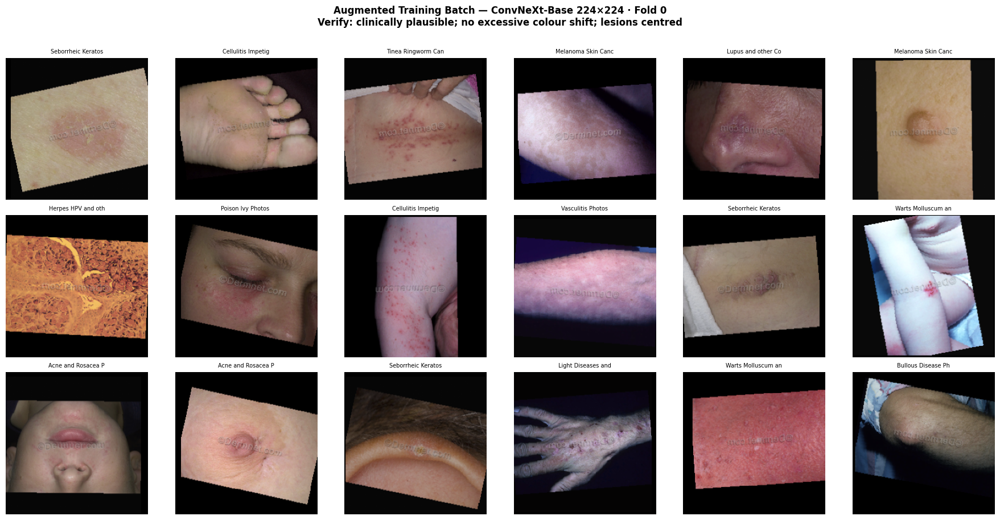

Batch shape : torch.Size([24, 3, 224, 224])
Train batches: 496  |  Val batches: 63


In [8]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams.update({'axes.spines.top': False, 'axes.spines.right': False})

train_loader, val_loader = get_loaders(train_df, FOLD_TO_TRAIN, BATCH_SIZE, NUM_WORKERS)
imgs, labels = next(iter(train_loader))

def denorm(tensor):
    mean = torch.tensor(IMAGENET_MEAN).view(3,1,1)
    std  = torch.tensor(IMAGENET_STD).view(3,1,1)
    return torch.clamp(tensor * std + mean, 0, 1).permute(1,2,0).numpy()

fig, axes = plt.subplots(3, 6, figsize=(18, 9))
for i, ax in enumerate(axes.flat):
    if i >= len(imgs): break
    ax.imshow(denorm(imgs[i]))
    ax.set_title(idx_to_class[labels[i].item()][:18], fontsize=7)
    ax.axis('off')
plt.suptitle(
    f'Augmented Training Batch — ConvNeXt-Base {IMG_SIZE}×{IMG_SIZE} · Fold {FOLD_TO_TRAIN}\n'
    'Verify: clinically plausible; no excessive colour shift; lesions centred',
    fontweight='bold', y=1.01
)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'augmented_batch_preview.png'), dpi=120, bbox_inches='tight')
plt.show()
print(f'Batch shape : {imgs.shape}')
print(f'Train batches: {len(train_loader)}  |  Val batches: {len(val_loader)}')

---
## Section 10 · Model Build — ConvNeXt-Base

In [9]:
import torch.nn as nn

def build_model(num_classes, pretrained=True):
    """
    ConvNeXt-Base from timm.
    Head: Global Avg Pool → LayerNorm → Dropout(0.3) → Linear(1024 → num_classes)

    drop_path_rate (stochastic depth): 0.3 for Base — higher than EfficientNetV2-S
    because ConvNeXt-Base has more parameters and needs stronger regularisation
    on this dataset size to avoid overfitting on minority classes.
    """
    model = timm.create_model(
        MODEL_NAME,
        pretrained     = pretrained,
        num_classes    = num_classes,
        drop_rate      = 0.3,    # classifier dropout
        drop_path_rate = 0.3,    # stochastic depth — higher for larger model
    )
    return model

model = build_model(NUM_CLASSES).to(DEVICE)

total     = sum(p.numel() for p in model.parameters())
trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f'Model         : {MODEL_NAME}')
print(f'Total params  : {total:,}')
print(f'Trainable     : {trainable:,}')
print(f'\nClassifier head:')
print(model.head)

# Quick memory estimate
if torch.cuda.is_available():
    dummy = torch.randn(1, 3, IMG_SIZE, IMG_SIZE).to(DEVICE)
    with torch.no_grad(): _ = model(dummy)
    mem = torch.cuda.memory_allocated()/1e9
    print(f'\nGPU memory (single forward pass): {mem:.2f} GB')
    del dummy; torch.cuda.empty_cache()

Model         : convnext_base
Total params  : 87,590,039
Trainable     : 87,590,039

Classifier head:
NormMlpClassifierHead(
  (global_pool): SelectAdaptivePool2d(pool_type=avg, flatten=Identity())
  (norm): LayerNorm2d((1024,), eps=1e-06, elementwise_affine=True)
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (pre_logits): Identity()
  (drop): Dropout(p=0.3, inplace=False)
  (fc): Linear(in_features=1024, out_features=23, bias=True)
)

GPU memory (single forward pass): 0.36 GB


---
## Section 11 · Focal Loss

In [10]:
class FocalLoss(nn.Module):
    """
    Focal Loss = -alpha_t * (1 - p_t)^gamma * log(p_t)
    Identical implementation to EfficientNetV2-S notebook for comparability.
    """
    def __init__(self, alpha, gamma=2.0, label_smoothing=0.1):
        super().__init__()
        self.alpha           = alpha
        self.gamma           = gamma
        self.label_smoothing = label_smoothing

    def forward(self, logits, targets):
        ce  = nn.functional.cross_entropy(
            logits, targets,
            weight          = self.alpha,
            label_smoothing = self.label_smoothing,
            reduction       = 'none'
        )
        pt  = torch.exp(-ce)
        return (((1 - pt) ** self.gamma) * ce).mean()

criterion = FocalLoss(alpha=class_weights, gamma=FOCAL_GAMMA, label_smoothing=LABEL_SMOOTHING)
print(f'Focal Loss: gamma={FOCAL_GAMMA}, label_smoothing={LABEL_SMOOTHING}')
print(f'Weight range: {class_weights.min().item():.4f} – {class_weights.max().item():.4f}')

Focal Loss: gamma=2.0, label_smoothing=0.1
Weight range: 0.4804 – 3.1133


---
## Section 12 · Optimiser & Learning Rate Schedule
*Lower LR_MAX than EfficientNetV2-S (5e-4 vs 1e-3). ConvNeXt-Base is 4× larger and more sensitive to large gradient updates during fine-tuning.*

In [11]:
import torch.optim as optim

def freeze_backbone(model):
    """Freeze all layers except the classification head."""
    for name, p in model.named_parameters():
        # ConvNeXt head is model.head — freeze everything else
        if 'head' not in name: p.requires_grad = False
    t = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print(f'Backbone frozen  — trainable: {t:,} (head only)')

def unfreeze_all(model):
    for p in model.parameters(): p.requires_grad = True
    t = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print(f'All layers unfrozen — trainable: {t:,}')

def make_optimizer_scheduler(model, phase, steps_per_epoch, n_epochs):
    if phase == 1:
        opt = optim.AdamW(
            filter(lambda p: p.requires_grad, model.parameters()),
            lr=LR_MAX, weight_decay=WEIGHT_DECAY
        )
        sch = optim.lr_scheduler.OneCycleLR(
            opt, max_lr=LR_MAX,
            steps_per_epoch=steps_per_epoch,
            epochs=n_epochs, pct_start=0.3, anneal_strategy='cos'
        )
    else:
        head_p     = [p for n, p in model.named_parameters() if 'head' in n]
        backbone_p = [p for n, p in model.named_parameters() if 'head' not in n]
        opt = optim.AdamW([
            {'params': backbone_p, 'lr': LR_MAX / 10},
            {'params': head_p,     'lr': LR_MAX},
        ], weight_decay=WEIGHT_DECAY)
        sch = optim.lr_scheduler.OneCycleLR(
            opt, max_lr=[LR_MAX / 10, LR_MAX],
            steps_per_epoch=steps_per_epoch,
            epochs=n_epochs, pct_start=0.2, anneal_strategy='cos'
        )
    return opt, sch

print('Optimiser and scheduler functions defined.')
print(f'Peak LR: {LR_MAX}  (backbone: {LR_MAX/10} | head: {LR_MAX})')

Optimiser and scheduler functions defined.
Peak LR: 0.0005  (backbone: 5e-05 | head: 0.0005)


---
## Section 13 · Training Loop (Two-Phase Fine-Tuning)

In [12]:
import time
from torch.cuda.amp import GradScaler, autocast

scaler = GradScaler()

def train_epoch(model, loader, optimizer, scheduler, criterion, epoch):
    model.train()
    loss_sum = correct = total = 0
    t0 = time.time()
    for i, (imgs, labels) in enumerate(loader):
        imgs, labels = imgs.to(DEVICE, non_blocking=True), labels.to(DEVICE, non_blocking=True)
        optimizer.zero_grad(set_to_none=True)
        with autocast():
            logits = model(imgs)
            loss   = criterion(logits, labels)
        scaler.scale(loss).backward()
        scaler.unscale_(optimizer)
        nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        scaler.step(optimizer); scaler.update()
        scheduler.step()
        loss_sum += loss.item() * imgs.size(0)
        correct  += (logits.argmax(1) == labels).sum().item()
        total    += imgs.size(0)
        if (i+1) % 50 == 0:
            print(f'  [{epoch}|{i+1}/{len(loader)}] '
                  f'loss={loss_sum/total:.4f} acc={correct/total:.4f} '
                  f'lr={scheduler.get_last_lr()[0]:.2e}')
    return loss_sum/total, correct/total, time.time()-t0

@torch.no_grad()
def validate(model, loader, criterion):
    model.eval()
    loss_sum = correct = total = 0
    for imgs, labels in loader:
        imgs, labels = imgs.to(DEVICE, non_blocking=True), labels.to(DEVICE, non_blocking=True)
        with autocast():
            logits = model(imgs)
            loss   = criterion(logits, labels)
        loss_sum += loss.item() * imgs.size(0)
        correct  += (logits.argmax(1) == labels).sum().item()
        total    += imgs.size(0)
    return loss_sum/total, correct/total

# ── Training state ────────────────────────────────────────────────────────────
history   = {'train_loss':[], 'val_loss':[], 'train_acc':[], 'val_acc':[], 'lr':[]}
best_acc  = 0.0
patience  = 0
best_ckpt = os.path.join(OUTPUT_DIR, f'best_convnext_fold{FOLD_TO_TRAIN}.pth')

# ── PHASE 1: Head warmup ──────────────────────────────────────────────────────
print('='*60)
print(f'PHASE 1 — Head Warmup (Epochs 1–{WARMUP_EPOCHS}, backbone frozen)')
print('='*60)
freeze_backbone(model)
opt, sch = make_optimizer_scheduler(model, 1, len(train_loader), WARMUP_EPOCHS)

for epoch in range(1, WARMUP_EPOCHS+1):
    tl, ta, dt = train_epoch(model, train_loader, opt, sch, criterion, epoch)
    vl, va     = validate(model, val_loader, criterion)
    history['train_loss'].append(tl); history['val_loss'].append(vl)
    history['train_acc'].append(ta);  history['val_acc'].append(va)
    history['lr'].append(sch.get_last_lr()[0])
    print(f'Epoch {epoch:>3}/{NUM_EPOCHS} | TrL={tl:.4f} TrA={ta:.4f} | VlL={vl:.4f} VlA={va:.4f} | {dt:.0f}s')

# ── PHASE 2: Full fine-tuning ─────────────────────────────────────────────────
print('\n' + '='*60)
print(f'PHASE 2 — Full Fine-tuning (Epochs {WARMUP_EPOCHS+1}–{NUM_EPOCHS})')
print('='*60)
unfreeze_all(model)
phase2_epochs = NUM_EPOCHS - WARMUP_EPOCHS
opt, sch = make_optimizer_scheduler(model, 2, len(train_loader), phase2_epochs)

for epoch in range(WARMUP_EPOCHS+1, NUM_EPOCHS+1):
    tl, ta, dt = train_epoch(model, train_loader, opt, sch, criterion, epoch)
    vl, va     = validate(model, val_loader, criterion)
    history['train_loss'].append(tl); history['val_loss'].append(vl)
    history['train_acc'].append(ta);  history['val_acc'].append(va)
    history['lr'].append(sch.get_last_lr()[0])
    print(f'Epoch {epoch:>3}/{NUM_EPOCHS} | TrL={tl:.4f} TrA={ta:.4f} | VlL={vl:.4f} VlA={va:.4f} | {dt:.0f}s', end='')
    if va > best_acc:
        best_acc = va; patience = 0
        torch.save({
            'epoch': epoch, 'model_state': model.state_dict(),
            'val_acc': va, 'val_loss': vl,
            'history': history, 'classes': classes, 'NUM_CLASSES': NUM_CLASSES
        }, best_ckpt)
        print(f'  ✓ checkpoint (val_acc={va:.4f})')
    else:
        patience += 1
        print(f'  (patience {patience}/{EARLY_STOP_PATIENCE})')
    if patience >= EARLY_STOP_PATIENCE:
        print(f'Early stopping at epoch {epoch}.'); break

print(f'\nTraining complete. Best val accuracy: {best_acc:.4f}')

PHASE 1 — Head Warmup (Epochs 1–5, backbone frozen)
Backbone frozen  — trainable: 25,623 (head only)
  [1|50/496] loss=4.3508 acc=0.0483 lr=2.53e-05
  [1|100/496] loss=4.3068 acc=0.0479 lr=4.11e-05
  [1|150/496] loss=4.2412 acc=0.0514 lr=6.67e-05
  [1|200/496] loss=4.1740 acc=0.0573 lr=1.01e-04
  [1|250/496] loss=4.1220 acc=0.0675 lr=1.42e-04
  [1|300/496] loss=4.0471 acc=0.0774 lr=1.89e-04
  [1|350/496] loss=3.9752 acc=0.0875 lr=2.38e-04
  [1|400/496] loss=3.9174 acc=0.0991 lr=2.89e-04
  [1|450/496] loss=3.8633 acc=0.1096 lr=3.38e-04
Epoch   1/30 | TrL=3.8121 TrA=0.1184 | VlL=2.4136 VlA=0.1981 | 113s
  [2|50/496] loss=3.1725 acc=0.2467 lr=4.21e-04
  [2|100/496] loss=3.1771 acc=0.2396 lr=4.55e-04
  [2|150/496] loss=3.1752 acc=0.2336 lr=4.80e-04
  [2|200/496] loss=3.1594 acc=0.2398 lr=4.95e-04
  [2|250/496] loss=3.1206 acc=0.2453 lr=5.00e-04
  [2|300/496] loss=3.1051 acc=0.2497 lr=4.99e-04
  [2|350/496] loss=3.0840 acc=0.2549 lr=4.96e-04
  [2|400/496] loss=3.0629 acc=0.2574 lr=4.90e-04


---
## Section 14 · Training Curves

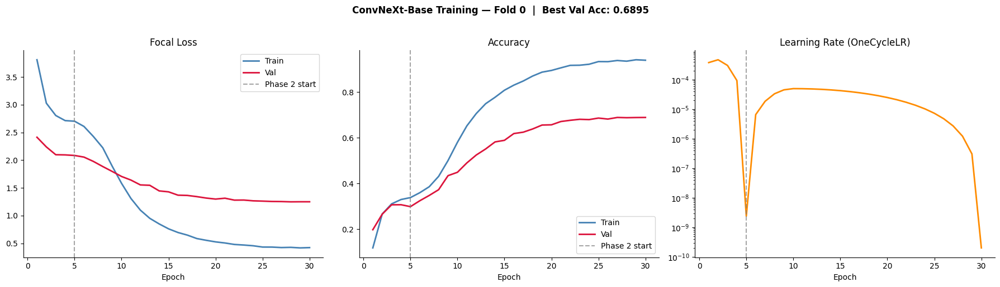

In [13]:
ep = range(1, len(history['train_loss'])+1)
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

axes[0].plot(ep, history['train_loss'], color='steelblue', lw=2, label='Train')
axes[0].plot(ep, history['val_loss'],   color='crimson',   lw=2, label='Val')
axes[0].axvline(WARMUP_EPOCHS, color='grey', ls='--', alpha=0.7, label='Phase 2 start')
axes[0].set_title('Focal Loss'); axes[0].set_xlabel('Epoch'); axes[0].legend()

axes[1].plot(ep, history['train_acc'], color='steelblue', lw=2, label='Train')
axes[1].plot(ep, history['val_acc'],   color='crimson',   lw=2, label='Val')
axes[1].axvline(WARMUP_EPOCHS, color='grey', ls='--', alpha=0.7, label='Phase 2 start')
axes[1].set_title('Accuracy'); axes[1].set_xlabel('Epoch'); axes[1].legend()

axes[2].plot(ep, history['lr'], color='darkorange', lw=2)
axes[2].axvline(WARMUP_EPOCHS, color='grey', ls='--', alpha=0.7)
axes[2].set_title('Learning Rate (OneCycleLR)')
axes[2].set_xlabel('Epoch'); axes[2].set_yscale('log')

plt.suptitle(f'ConvNeXt-Base Training — Fold {FOLD_TO_TRAIN}  |  Best Val Acc: {best_acc:.4f}',
             fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, f'training_curves_fold{FOLD_TO_TRAIN}.png'), dpi=120, bbox_inches='tight')
plt.show()

---
## Section 15 · Load Best Checkpoint & Test Set Inference

In [14]:
import torch.nn.functional as F

checkpoint = torch.load(best_ckpt, map_location=DEVICE)
model.load_state_dict(checkpoint['model_state'])
model.eval()
print(f'Best checkpoint loaded — epoch {checkpoint["epoch"]}  val_acc={checkpoint["val_acc"]:.4f}')

test_ds_paths = SkinDataset(test_df, val_transform, return_path=True)
test_loader_paths = DataLoader(test_ds_paths, batch_size=BATCH_SIZE*2, shuffle=False,
                                num_workers=NUM_WORKERS, pin_memory=True)

all_preds, all_labels, all_probs, all_paths = [], [], [], []

with torch.no_grad():
    for imgs, labels, paths in test_loader_paths:
        imgs = imgs.to(DEVICE, non_blocking=True)
        with autocast():
            logits = model(imgs)
        probs = F.softmax(logits, dim=1).cpu().numpy()
        all_probs.extend(probs)
        all_preds.extend(probs.argmax(axis=1))
        all_labels.extend(labels.numpy())
        all_paths.extend(paths)

all_preds     = np.array(all_preds)
all_labels    = np.array(all_labels)
all_probs     = np.array(all_probs)
all_probs_max = all_probs.max(axis=1)
correct_mask  = (all_preds == all_labels)
overall_acc   = correct_mask.mean()

print(f'Test images      : {len(all_labels):,}')
print(f'Overall accuracy : {overall_acc:.4f}  ({overall_acc*100:.2f}%)')

Best checkpoint loaded — epoch 27  val_acc=0.6895
Test images      : 3,409
Overall accuracy : 0.6911  (69.11%)


---
## Section 16 · Classification Report

In [15]:
from sklearn.metrics import classification_report, confusion_matrix, top_k_accuracy_score

report_str  = classification_report(all_labels, all_preds, target_names=classes, digits=4)
report_dict = classification_report(all_labels, all_preds, target_names=classes,
                                    digits=4, output_dict=True)
print('CLASSIFICATION REPORT — ConvNeXt-Base')
print('='*70)
print(report_str)
with open(os.path.join(OUTPUT_DIR, 'classification_report.txt'), 'w') as f:
    f.write(report_str)

CLASSIFICATION REPORT — ConvNeXt-Base
                                                                    precision    recall  f1-score   support

                                           Acne and Rosacea Photos     0.3929    0.7857    0.5238        42
Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions     0.8161    0.6716    0.7368       271
                                          Atopic Dermatitis Photos     0.6549    0.7750    0.7099       120
                                            Bullous Disease Photos     0.5842    0.5566    0.5700       106
                Cellulitis Impetigo and other Bacterial Infections     0.4684    0.5362    0.5000        69
                                                     Eczema Photos     0.6627    0.6346    0.6483       260
                                      Exanthems and Drug Eruptions     0.5714    0.6154    0.5926        91
                 Hair Loss Photos Alopecia and other Hair Diseases     0.5942    0.9111    0.7193

---
## Section 17 · Top-K Accuracy

In [16]:
for k in [1, 3, 5]:
    acc = top_k_accuracy_score(all_labels, all_probs, k=k, labels=list(range(NUM_CLASSES)))
    print(f'Top-{k} Accuracy: {acc:.4f}  ({acc*100:.2f}%)')
print('\nTop-3/5 reflect a clinical triage scenario: correct class in model top-N suggestions.')

Top-1 Accuracy: 0.6908  (69.08%)
Top-3 Accuracy: 0.8580  (85.80%)
Top-5 Accuracy: 0.9073  (90.73%)

Top-3/5 reflect a clinical triage scenario: correct class in model top-N suggestions.


---
## Section 18 · Confusion Matrices

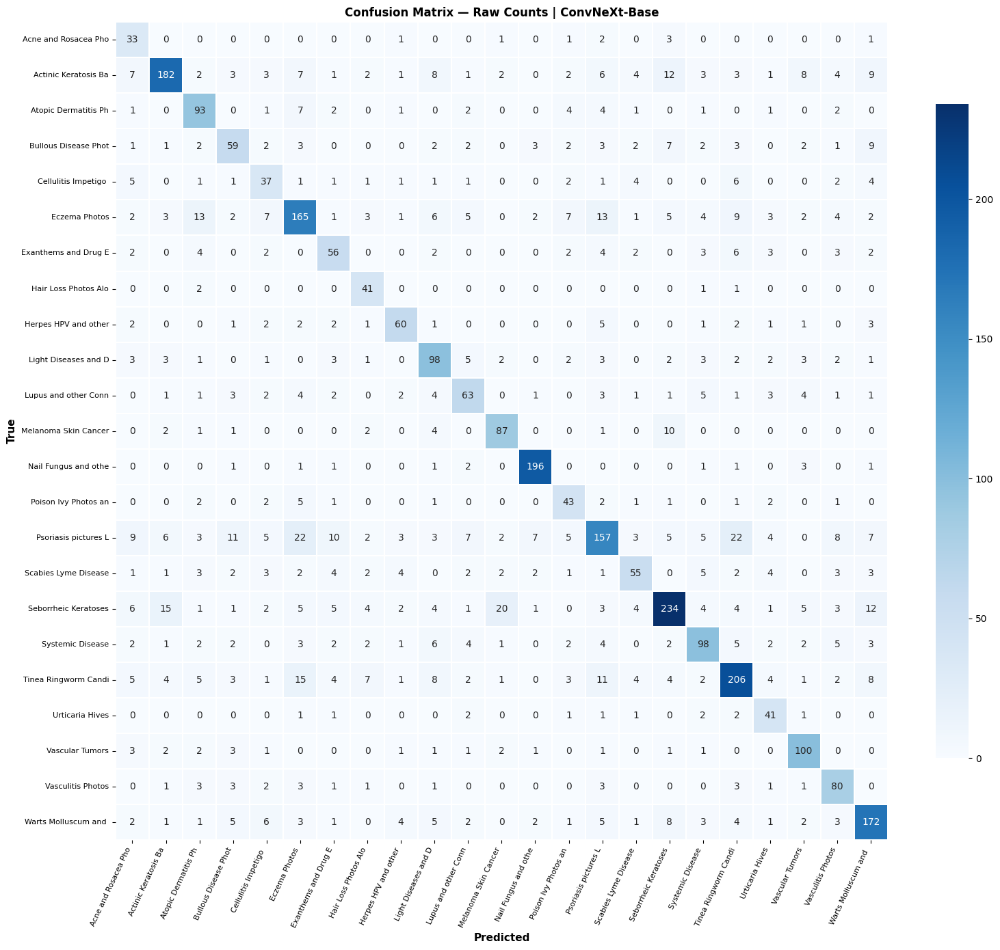

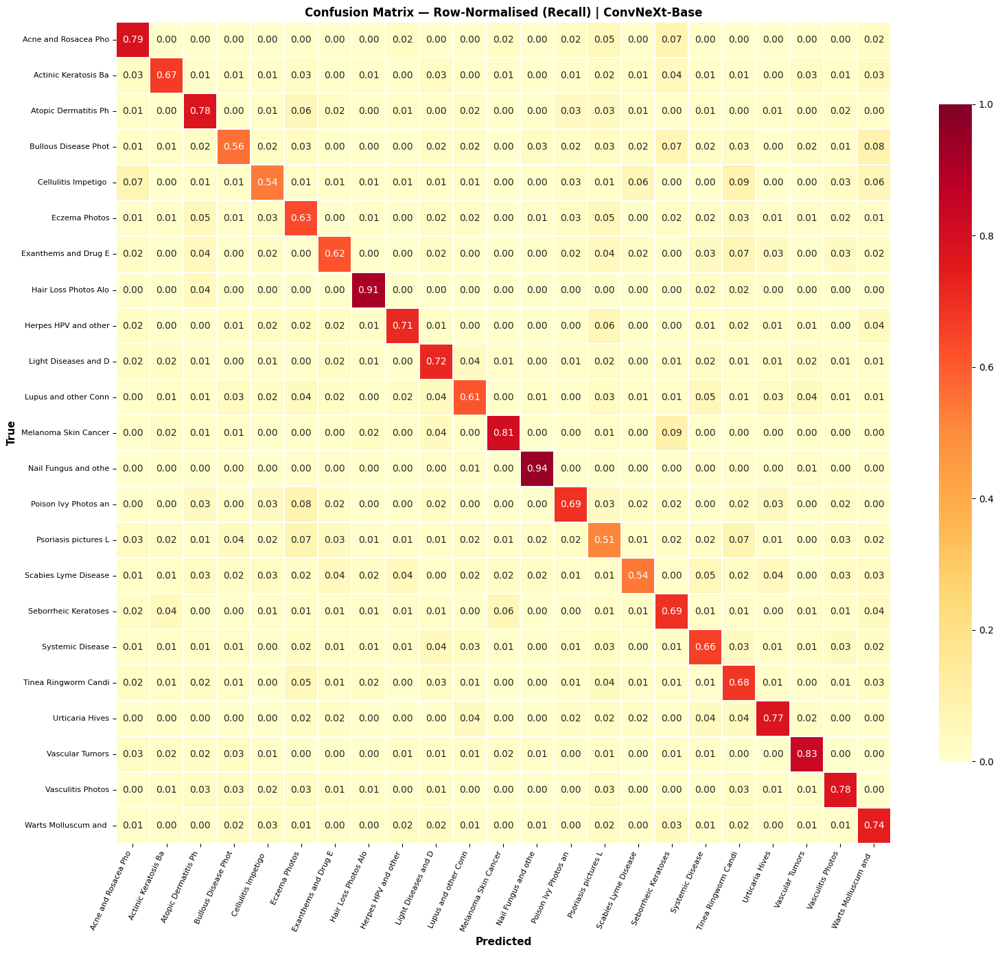

In [17]:
import seaborn as sns

cm      = confusion_matrix(all_labels, all_preds)
cm_norm = cm.astype(float) / cm.sum(axis=1, keepdims=True)
short   = [c[:20] for c in classes]

for title, data, fmt, cmap in [
    ('Raw Counts',              cm,      'd',   'Blues'),
    ('Row-Normalised (Recall)', cm_norm, '.2f', 'YlOrRd')
]:
    fig, ax = plt.subplots(figsize=(16, 14))
    sns.heatmap(data, annot=True, fmt=fmt, cmap=cmap,
                xticklabels=short, yticklabels=short,
                linewidths=0.3, ax=ax, cbar_kws={'shrink':0.8},
                vmin=0, vmax=(1 if fmt=='.2f' else None))
    ax.set_xlabel('Predicted', fontsize=11, fontweight='bold')
    ax.set_ylabel('True',      fontsize=11, fontweight='bold')
    ax.set_title(f'Confusion Matrix — {title} | ConvNeXt-Base', fontweight='bold')
    plt.xticks(rotation=65, ha='right', fontsize=8)
    plt.yticks(fontsize=8)
    plt.tight_layout()
    fname = 'cm_raw.png' if fmt=='d' else 'cm_normalised.png'
    plt.savefig(os.path.join(OUTPUT_DIR, fname), dpi=120, bbox_inches='tight')
    plt.show()

---
## Section 19 · Per-class Accuracy Analysis

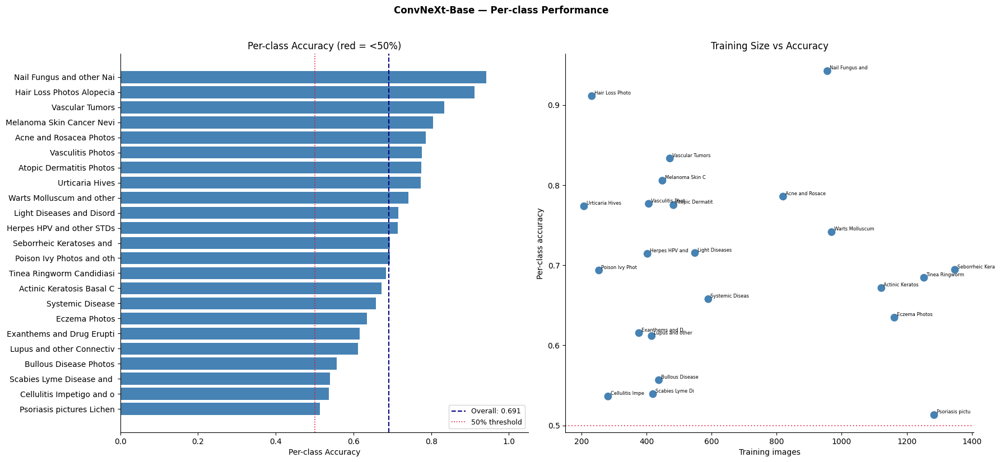

In [18]:
per_class_acc = cm_norm.diagonal()
train_counts  = train_df.groupby('label').size().reindex(range(NUM_CLASSES)).values
sorted_idx    = np.argsort(per_class_acc)

fig, axes = plt.subplots(1, 2, figsize=(18, max(6, NUM_CLASSES*0.35)))

colors = ['crimson' if per_class_acc[i] < 0.5 else 'steelblue' for i in sorted_idx]
axes[0].barh([classes[i][:25] for i in sorted_idx], per_class_acc[sorted_idx], color=colors)
axes[0].axvline(overall_acc, color='navy',   ls='--', lw=1.5, label=f'Overall: {overall_acc:.3f}')
axes[0].axvline(0.5,         color='crimson', ls=':',  lw=1.2, label='50% threshold')
axes[0].set_xlabel('Per-class Accuracy'); axes[0].legend(fontsize=9)
axes[0].set_title('Per-class Accuracy (red = <50%)')
axes[0].set_xlim(0, 1.05)

axes[1].scatter(train_counts, per_class_acc,
               c=['crimson' if a<0.5 else 'steelblue' for a in per_class_acc], s=80, zorder=3)
for i, cls in enumerate(classes):
    axes[1].annotate(cls[:15], (train_counts[i], per_class_acc[i]),
                     fontsize=6, xytext=(3,2), textcoords='offset points')
axes[1].axhline(0.5, color='crimson', ls=':', alpha=0.7)
axes[1].set_xlabel('Training images'); axes[1].set_ylabel('Per-class accuracy')
axes[1].set_title('Training Size vs Accuracy')

plt.suptitle('ConvNeXt-Base — Per-class Performance', fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'per_class_accuracy.png'), dpi=120, bbox_inches='tight')
plt.show()

---
## Section 20 · Best & Worst Performing Classes

In [19]:
metrics_df = pd.DataFrame({
    'Class':     classes,
    'Accuracy':  per_class_acc,
    'F1':        [report_dict[c]['f1-score']    for c in classes],
    'Precision': [report_dict[c]['precision']   for c in classes],
    'Recall':    [report_dict[c]['recall']       for c in classes],
    'Support':   [int(report_dict[c]['support']) for c in classes],
    'Train_N':   train_counts,
}).sort_values('F1', ascending=False)

print('TOP 5 BEST PERFORMING')
print(metrics_df.head(5).to_string(index=False, float_format='{:.4f}'.format))
print('\nBOTTOM 5 WORST PERFORMING')
print(metrics_df.tail(5).to_string(index=False, float_format='{:.4f}'.format))

metrics_df.to_csv(os.path.join(OUTPUT_DIR, 'per_class_metrics.csv'), index=False)

print('\nDIAGNOSIS GUIDE:')
print('  Low F1 + low Train_N  → data scarcity')
print('  Low F1 + adequate N   → visual similarity; check confusion matrix')
print('  ConvNeXt note: the 7x7 depthwise kernel should give an advantage on')
print('  texture-heavy classes (psoriasis, ichthyosis) vs EfficientNetV2-S.')
print('  Check whether those classes improved in this run.')

TOP 5 BEST PERFORMING
                                                             Class  Accuracy     F1  Precision  Recall  Support  Train_N
                                Nail Fungus and other Nail Disease    0.9423 0.9267     0.9116  0.9423      208      956
                                                   Vascular Tumors    0.8333 0.7843     0.7407  0.8333      120      472
                               Melanoma Skin Cancer Nevi and Moles    0.8056 0.7632     0.7250  0.8056      108      449
                      Seborrheic Keratoses and other Benign Tumors    0.6944 0.7405     0.7932  0.6944      337     1348
Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions    0.6716 0.7368     0.8161  0.6716      271     1122

BOTTOM 5 WORST PERFORMING
                                                Class  Accuracy     F1  Precision  Recall  Support  Train_N
Scabies Lyme Disease and other Infestations and Bites    0.5392 0.5914     0.6548  0.5392      102      420
Psoriasis

---
## Section 21 · Confidence & Calibration Analysis

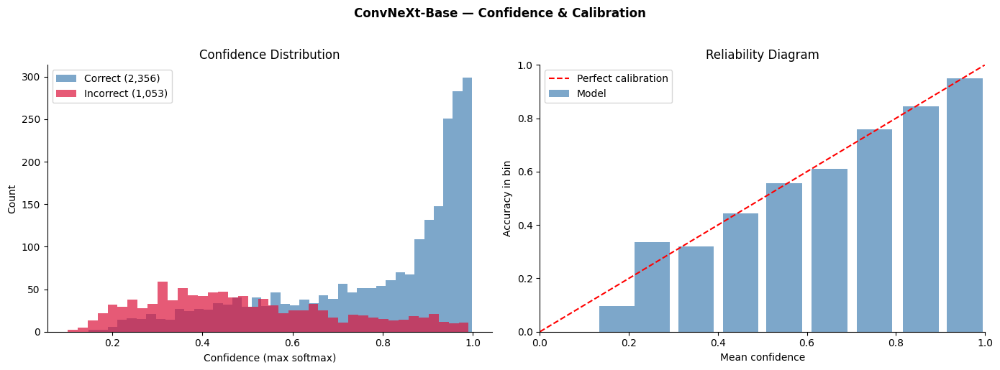

Mean confidence — correct: 0.7856 | incorrect: 0.4944


In [20]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].hist(all_probs_max[correct_mask],  bins=40, alpha=0.7, color='steelblue',
             label=f'Correct ({correct_mask.sum():,})')
axes[0].hist(all_probs_max[~correct_mask], bins=40, alpha=0.7, color='crimson',
             label=f'Incorrect ({(~correct_mask).sum():,})')
axes[0].set_xlabel('Confidence (max softmax)'); axes[0].set_ylabel('Count')
axes[0].set_title('Confidence Distribution')
axes[0].legend()

bins = np.linspace(0, 1, 11)
bin_accs, bin_confs = [], []
for lo, hi in zip(bins[:-1], bins[1:]):
    mask = (all_probs_max >= lo) & (all_probs_max < hi)
    if mask.sum() > 0:
        bin_accs.append(correct_mask[mask].mean())
        bin_confs.append(all_probs_max[mask].mean())

axes[1].bar(bin_confs, bin_accs, width=0.08, alpha=0.7, color='steelblue', label='Model')
axes[1].plot([0,1],[0,1],'r--', lw=1.5, label='Perfect calibration')
axes[1].set_xlabel('Mean confidence'); axes[1].set_ylabel('Accuracy in bin')
axes[1].set_title('Reliability Diagram')
axes[1].legend(); axes[1].set_xlim(0,1); axes[1].set_ylim(0,1)

plt.suptitle('ConvNeXt-Base — Confidence & Calibration', fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'confidence_calibration.png'), dpi=120, bbox_inches='tight')
plt.show()
print(f'Mean confidence — correct: {all_probs_max[correct_mask].mean():.4f} | '
      f'incorrect: {all_probs_max[~correct_mask].mean():.4f}')

---
## Section 22 · Top Confused Class Pairs

In [21]:
cm_off = cm.copy(); np.fill_diagonal(cm_off, 0)
flat   = np.argsort(cm_off.ravel())[::-1][:15]
ri, ci = np.unravel_index(flat, cm.shape)

confused_df = pd.DataFrame({
    'True Class':    [classes[r] for r in ri],
    'Predicted As':  [classes[c] for c in ci],
    'Count':         [cm_off[r,c] for r,c in zip(ri,ci)],
    'Recall Impact': [f'{cm_off[r,c]/cm[r,:].sum()*100:.1f}%' for r,c in zip(ri,ci)],
})
print('TOP 15 MOST CONFUSED PAIRS — ConvNeXt-Base')
print('='*70)
print(confused_df.to_string(index=False))
print('\nNote: ConvNeXt\'s larger 7x7 receptive field should reduce texture-confusion pairs.')
print('Compare this list to EDA VIZ 20 (texture/redness scatter).')
confused_df.to_csv(os.path.join(OUTPUT_DIR, 'confused_pairs.csv'), index=False)

TOP 15 MOST CONFUSED PAIRS — ConvNeXt-Base
                                                        True Class                                                       Predicted As  Count Recall Impact
             Psoriasis pictures Lichen Planus and related diseases                                                      Eczema Photos     22          7.2%
             Psoriasis pictures Lichen Planus and related diseases             Tinea Ringworm Candidiasis and other Fungal Infections     22          7.2%
                      Seborrheic Keratoses and other Benign Tumors                                Melanoma Skin Cancer Nevi and Moles     20          5.9%
                      Seborrheic Keratoses and other Benign Tumors Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions     15          4.5%
            Tinea Ringworm Candidiasis and other Fungal Infections                                                      Eczema Photos     15          5.0%
                           

---
## Section 23 · Grad-CAM Setup

### Target Layer Selection for ConvNeXt-Base
ConvNeXt's block structure is different from EfficientNetV2-S, so the target layer must be selected carefully.

The correct target is **`model.stages[-1][-1].conv_dw`** — the depthwise convolution in the last block of Stage 4. This layer operates at **7×7 spatial resolution with 1024 channels**.

Why this layer specifically:
- **7×7 spatial maps:** Low enough resolution that Grad-CAM heatmaps need upsampling to the input size — but high enough to localise which quadrant of the image the model focused on.
- **Depthwise convolution:** In ConvNeXt, the depthwise conv is where spatial mixing happens. It is the spatial feature extractor in each block. Targeting this layer captures where in the image the spatial features are strongest.
- **Last block of Stage 4:** Captures the highest-level semantic features before the global average pooling collapses spatial information entirely.

**Alternative:** `model.stages[-1][-1]` (the full last block) also works but the depthwise conv gives cleaner gradient flow for Grad-CAM.

In [28]:
import cv2
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

# ConvNeXt-Base target: depthwise conv in last block of Stage 4
last_block   = list(model.stages[-1].blocks)[-1]
target_layer = [last_block.conv_dw]

grad_cam = GradCAM(
    model         = model,
    target_layers = target_layer,
)

def get_cam(img_path, class_idx):
    """Return (overlay, cam_map, rgb_img) for image and target class."""
    pil     = Image.open(img_path)
    t       = val_transform(pil).unsqueeze(0).to(DEVICE)
    cam     = grad_cam(input_tensor=t, targets=[ClassifierOutputTarget(class_idx)])[0]
    mean    = torch.tensor(IMAGENET_MEAN).view(3,1,1)
    std     = torch.tensor(IMAGENET_STD).view(3,1,1)
    rgb     = torch.clamp(t.squeeze(0).cpu()*std+mean, 0, 1).permute(1,2,0).numpy()
    overlay = show_cam_on_image(rgb.astype(np.float32), cam, use_rgb=True)
    return overlay, cam, rgb

print(f'Grad-CAM target: {last_block.conv_dw}')
print(f'  → Stage 4 last block, depthwise conv, 7×7 spatial maps, 1024 channels')

Grad-CAM target: Conv2d(1024, 1024, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), groups=1024)
  → Stage 4 last block, depthwise conv, 7×7 spatial maps, 1024 channels


---
## Section 24 · Correct Predictions Audit

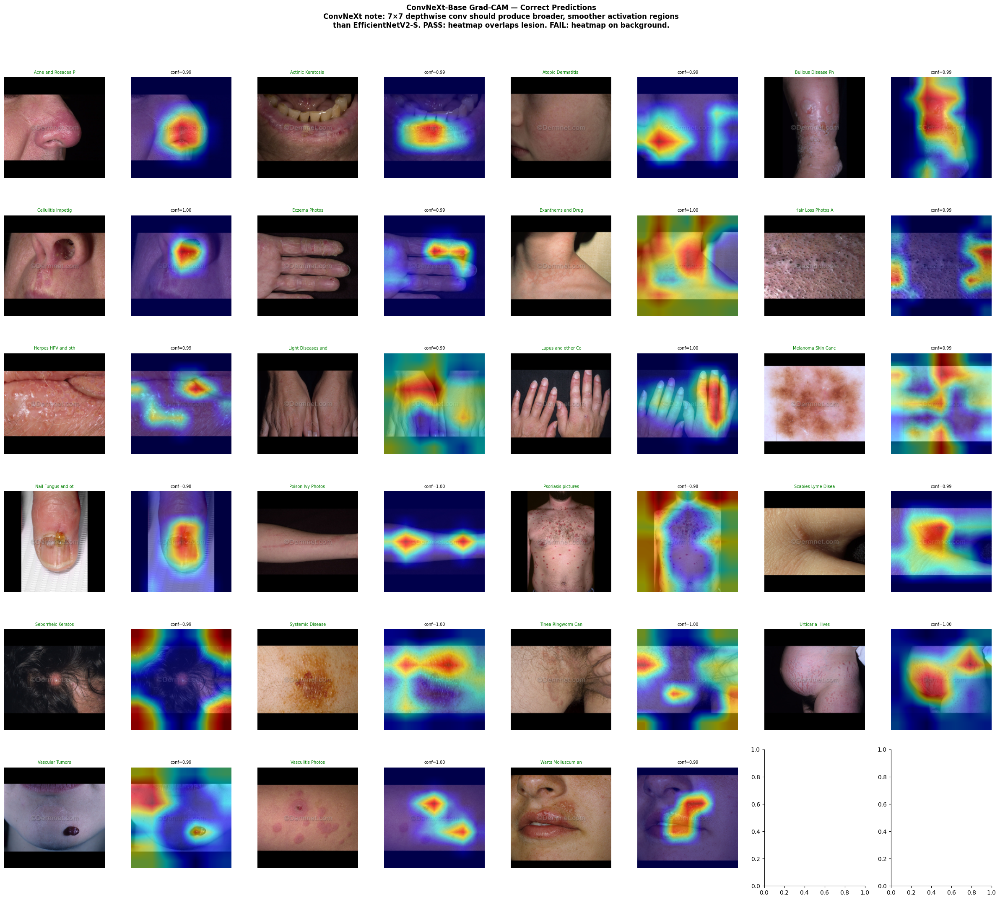

In [29]:
correct_samples = []
for cls_idx in range(NUM_CLASSES):
    mask = np.where(correct_mask & (all_labels == cls_idx))[0]
    if len(mask) == 0: continue
    correct_samples.append(mask[np.argsort(all_probs_max[mask])[::-1][0]])

n_cols = 4
n_rows = (len(correct_samples) + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols*2, figsize=(n_cols*6, n_rows*3.5))

for i, idx in enumerate(correct_samples):
    r, cp = divmod(i, n_cols)
    ax0 = axes[r, cp*2] if n_rows>1 else axes[cp*2]
    ax1 = axes[r, cp*2+1] if n_rows>1 else axes[cp*2+1]
    overlay, _, rgb = get_cam(all_paths[idx], int(all_labels[idx]))
    ax0.imshow(rgb)
    ax0.set_title(classes[all_labels[idx]][:18], fontsize=7, color='green')
    ax0.axis('off')
    ax1.imshow(overlay)
    ax1.set_title(f'conf={all_probs_max[idx]:.2f}', fontsize=7)
    ax1.axis('off')

plt.suptitle(
    'ConvNeXt-Base Grad-CAM — Correct Predictions\n'
    'ConvNeXt note: 7×7 depthwise conv should produce broader, smoother activation regions\n'
    'than EfficientNetV2-S. PASS: heatmap overlaps lesion. FAIL: heatmap on background.',
    fontweight='bold', y=1.02
)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'gradcam_correct.png'), dpi=100, bbox_inches='tight')
plt.show()

---
## Section 25 · High-Confidence Errors Audit

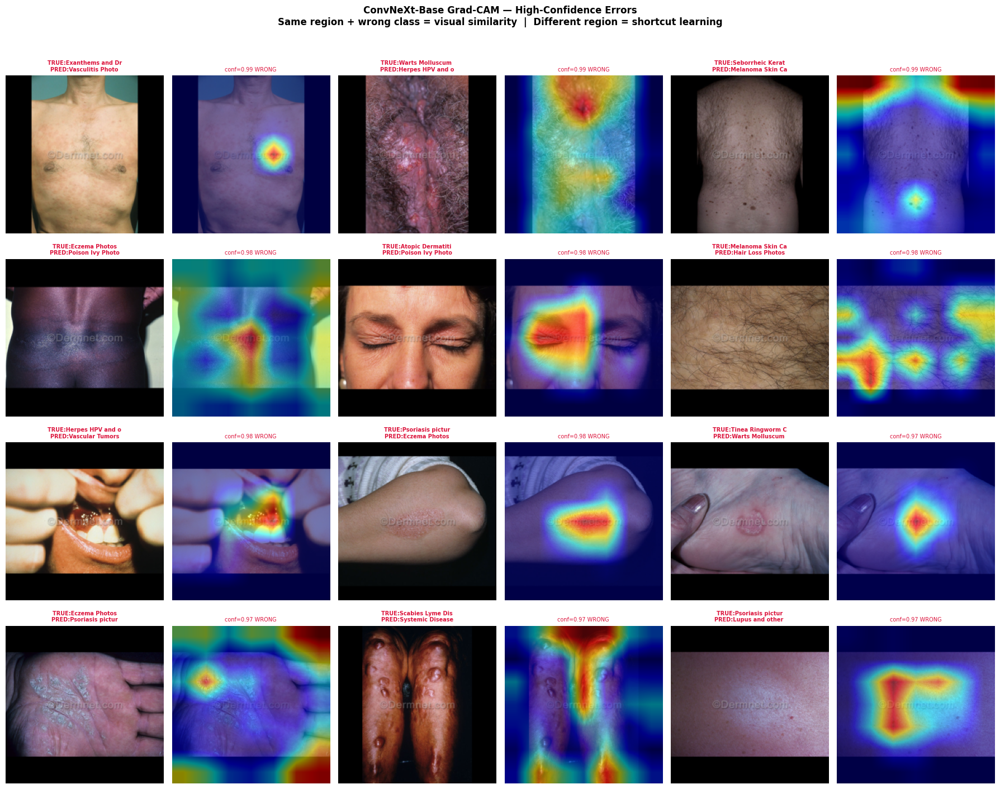

In [30]:
err_idx   = np.where(~correct_mask)[0]
hc_errors = err_idx[np.argsort(all_probs_max[err_idx])[::-1]][:12]

n_cols = 3; n_rows = (len(hc_errors)+n_cols-1)//n_cols
fig, axes = plt.subplots(n_rows, n_cols*2, figsize=(n_cols*6, n_rows*3.5))

for i, idx in enumerate(hc_errors):
    r, cp = divmod(i, n_cols)
    ax0 = axes[r, cp*2] if n_rows>1 else axes[cp*2]
    ax1 = axes[r, cp*2+1] if n_rows>1 else axes[cp*2+1]
    overlay, _, rgb = get_cam(all_paths[idx], int(all_preds[idx]))
    tc = classes[all_labels[idx]][:16]; pc = classes[all_preds[idx]][:16]
    ax0.imshow(rgb)
    ax0.set_title(f'TRUE:{tc}\nPRED:{pc}', fontsize=7, color='crimson', fontweight='bold')
    ax0.axis('off')
    ax1.imshow(overlay)
    ax1.set_title(f'conf={all_probs_max[idx]:.2f} WRONG', fontsize=7, color='crimson')
    ax1.axis('off')

plt.suptitle(
    'ConvNeXt-Base Grad-CAM — High-Confidence Errors\n'
    'Same region + wrong class = visual similarity  |  Different region = shortcut learning',
    fontweight='bold', y=1.02
)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'gradcam_errors.png'), dpi=100, bbox_inches='tight')
plt.show()

---
## Section 26 · Per-class Grad-CAM Gallery

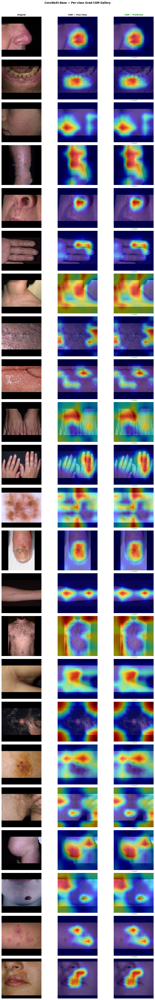

In [31]:
fig, axes = plt.subplots(NUM_CLASSES, 3, figsize=(12, NUM_CLASSES*2.8))

for ci in range(NUM_CLASSES):
    pool = np.where(correct_mask & (all_labels==ci))[0]
    if len(pool)==0: pool = np.where(all_labels==ci)[0]
    if len(pool)==0:
        for col in range(3): axes[ci,col].axis('off')
        continue
    idx     = pool[np.argsort(all_probs_max[pool])[::-1][0]]
    _, _, rgb      = get_cam(all_paths[idx], ci)
    ov_true, _, _  = get_cam(all_paths[idx], ci)
    pred_ci        = int(all_preds[idx])
    ov_pred, _, _  = get_cam(all_paths[idx], pred_ci)
    pred_lbl = '✓ Correct' if pred_ci==ci else classes[pred_ci][:16]
    pred_col = 'green' if pred_ci==ci else 'crimson'

    axes[ci,0].imshow(rgb)
    axes[ci,0].set_ylabel(classes[ci][:22], rotation=0, labelpad=105,
                          va='center', fontsize=7, fontweight='bold')
    axes[ci,0].axis('off')
    if ci==0: axes[ci,0].set_title('Original', fontsize=9, fontweight='bold')

    axes[ci,1].imshow(ov_true); axes[ci,1].axis('off')
    if ci==0: axes[ci,1].set_title('CAM — True Class', fontsize=9, fontweight='bold')

    axes[ci,2].imshow(ov_pred)
    axes[ci,2].set_title(pred_lbl, fontsize=7, color=pred_col)
    axes[ci,2].axis('off')
    if ci==0: axes[ci,2].set_title('CAM — Predicted', fontsize=9, fontweight='bold')

plt.suptitle('ConvNeXt-Base — Per-class Grad-CAM Gallery', fontweight='bold', y=1.005)
plt.tight_layout(h_pad=0.2)
plt.savefig(os.path.join(OUTPUT_DIR, 'gradcam_gallery.png'), dpi=90, bbox_inches='tight')
plt.show()

---
## Section 27 · Centre Coverage Score
*Quantifies whether Grad-CAM activations fall on the lesion centre or the image periphery.*

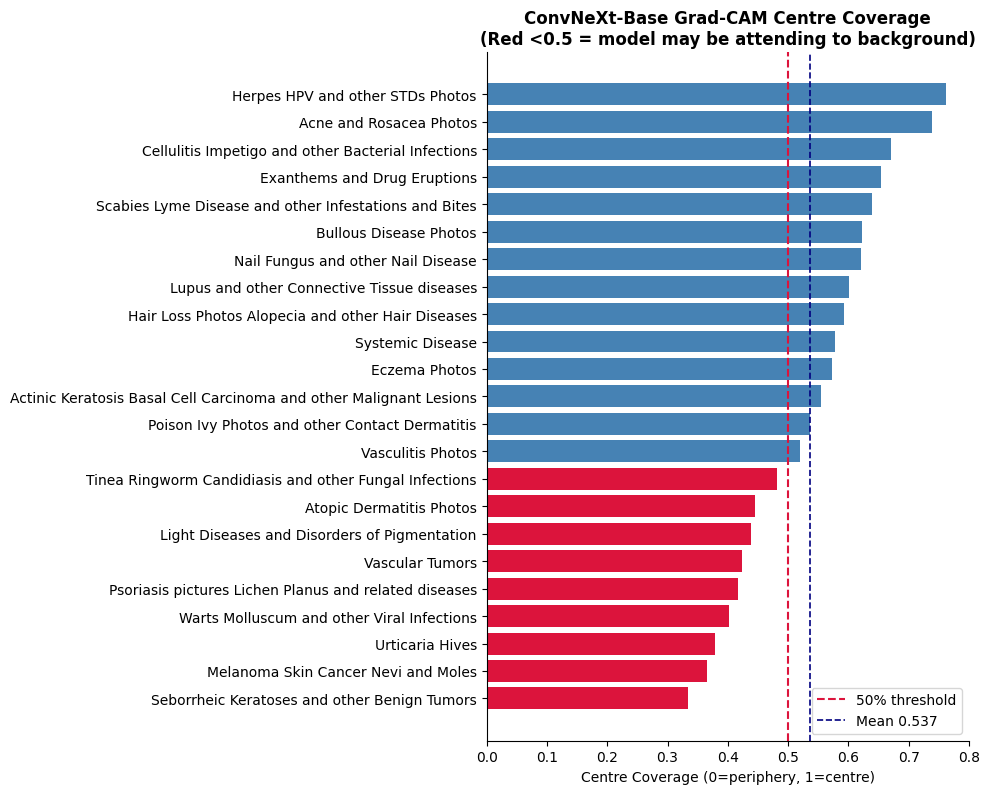

Mean coverage: 0.5367
Classes needing manual review: ['Seborrheic Keratoses and other Benign Tumors', 'Melanoma Skin Cancer Nevi and Moles', 'Urticaria Hives', 'Warts Molluscum and other Viral Infections', 'Psoriasis pictures Lichen Planus and related diseases', 'Vascular Tumors', 'Light Diseases and Disorders of Pigmentation', 'Atopic Dermatitis Photos', 'Tinea Ringworm Candidiasis and other Fungal Infections']


In [32]:
def centre_coverage(cam_map, frac=0.6):
    h, w = cam_map.shape
    mh, mw = int(h*(1-frac)/2), int(w*(1-frac)/2)
    return cam_map[mh:h-mh, mw:w-mw].sum() / (cam_map.sum() + 1e-8)

cov_rows = []
for ci in range(NUM_CLASSES):
    pool = np.where(correct_mask & (all_labels==ci))[0][:5]
    for idx in pool:
        _, cam_map, _ = get_cam(all_paths[idx], ci)
        cov_rows.append({'Class': classes[ci], 'Coverage': centre_coverage(cam_map)})

cov_df    = pd.DataFrame(cov_rows)
class_cov = cov_df.groupby('Class')['Coverage'].mean().sort_values()

fig, ax = plt.subplots(figsize=(10, max(5, NUM_CLASSES*0.35)))
colors  = ['crimson' if v<0.5 else 'steelblue' for v in class_cov.values]
ax.barh(class_cov.index, class_cov.values, color=colors)
ax.axvline(0.5,              color='crimson', ls='--', lw=1.5, label='50% threshold')
ax.axvline(class_cov.mean(), color='navy',   ls='--', lw=1.2,
           label=f'Mean {class_cov.mean():.3f}')
ax.set_xlabel('Centre Coverage (0=periphery, 1=centre)')
ax.set_title('ConvNeXt-Base Grad-CAM Centre Coverage\n'
             '(Red <0.5 = model may be attending to background)', fontweight='bold')
ax.legend()
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'gradcam_coverage.png'), dpi=120, bbox_inches='tight')
plt.show()

low_cov = class_cov[class_cov < 0.5]
print(f'Mean coverage: {class_cov.mean():.4f}')
if len(low_cov):
    print(f'Classes needing manual review: {list(low_cov.index)}')
else:
    print('All classes: adequate centre coverage (>0.5).')

---
## Section 28 · Final Summary

In [35]:
macro_f1 = report_dict['macro avg']['f1-score']
macro_r  = report_dict['macro avg']['recall']
macro_p  = report_dict['macro avg']['precision']
wt_f1    = report_dict['weighted avg']['f1-score']
top3     = top_k_accuracy_score(all_labels, all_probs, k=3, labels=list(range(NUM_CLASSES)))
top5     = top_k_accuracy_score(all_labels, all_probs, k=5, labels=list(range(NUM_CLASSES)))

print('='*60)
print('  FINAL RESULTS — ConvNeXt-Base on DermNet')
print('='*60)
print(f'  Top-1 Accuracy     : {overall_acc:.4f}  ({overall_acc*100:.2f}%)')
print(f'  Top-3 Accuracy     : {top3:.4f}  ({top3*100:.2f}%)')
print(f'  Top-5 Accuracy     : {top5:.4f}  ({top5*100:.2f}%)')
print(f'  Macro Precision    : {macro_p:.4f}')
print(f'  Macro Recall       : {macro_r:.4f}')
print(f'  Macro F1 (primary) : {macro_f1:.4f}')
print(f'  Weighted F1        : {wt_f1:.4f}')
print(f'  Best class F1      : {metrics_df["F1"].max():.4f}  ({metrics_df.iloc[0]["Class"]})')
print(f'  Worst class F1     : {metrics_df["F1"].min():.4f}  ({metrics_df.iloc[-1]["Class"]})')
print(f'  CAM coverage (mean): {class_cov.mean():.4f}')
print(f'  CAM low-coverage   : {len(low_cov)} class(es) flagged')
print('='*60)
print('\n  Architecture notes:')
print('  - 7x7 depthwise conv → expect stronger performance on texture-heavy classes')
print('  - LayerNorm → more stable under the brightness variability found in EDA VIZ 14')
print('  - Larger model (89M) → higher capacity but more regularisation needed')
print('  - Grad-CAM activations from 7x7 maps → broader heatmaps than EfficientNetV2-S (10x10)')
print(f'\n  Outputs saved to: {OUTPUT_DIR}')
print('  classification_report.txt  |  per_class_metrics.csv  |  confused_pairs.csv')
print('  training_curves_fold0.png  |  cm_raw.png  |  cm_normalised.png')
print('  per_class_accuracy.png     |  confidence_calibration.png')
print('  gradcam_correct.png        |  gradcam_errors.png')
print('  gradcam_gallery.png        |  gradcam_coverage.png')

  FINAL RESULTS — ConvNeXt-Base on DermNet
  Top-1 Accuracy     : 0.6911  (69.11%)
  Top-3 Accuracy     : 0.8580  (85.80%)
  Top-5 Accuracy     : 0.9073  (90.73%)
  Macro Precision    : 0.6563
  Macro Recall       : 0.7036
  Macro F1 (primary) : 0.6723
  Weighted F1        : 0.6912
  Best class F1      : 0.9267  (Nail Fungus and other Nail Disease)
  Worst class F1     : 0.5000  (Cellulitis Impetigo and other Bacterial Infections)
  CAM coverage (mean): 0.5367
  CAM low-coverage   : 9 class(es) flagged

  Architecture notes:
  - 7x7 depthwise conv → expect stronger performance on texture-heavy classes
  - LayerNorm → more stable under the brightness variability found in EDA VIZ 14
  - Larger model (89M) → higher capacity but more regularisation needed
  - Grad-CAM activations from 7x7 maps → broader heatmaps than EfficientNetV2-S (10x10)

  Outputs saved to: /kaggle/working/convnext_outputs
  classification_report.txt  |  per_class_metrics.csv  |  confused_pairs.csv
  training_curves_f